In [20]:
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np

1. Tạo một ma trận điểm ảnh với kích thước 800x800 và mỗi điểm ảnh có giá trị được sinh ngẫu nhiên từ 0 đến 255. Hiển thị bức ảnh này.

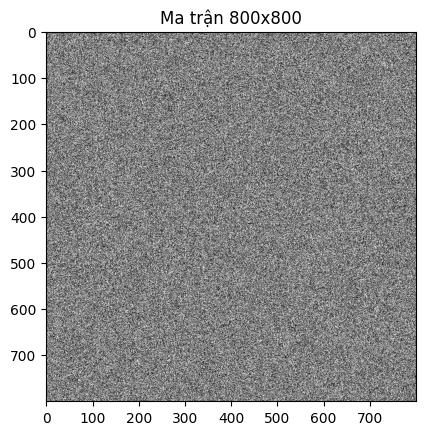

In [ ]:
# Tạo ma trận điểm ảnh ngẫu nhiên với kích thước 800x800 và ba kênh màu RGB
img = np.random.randint(0, 256, (800, 800), dtype='uint8')

# Hiển thị ảnh màu bằng OpenCV
cv.imshow('Image', img)
cv.waitKey(0) 

# Hiển thị ảnh bằng Matplotlib
plt.imshow(img, cmap='gray')  
plt.title('Ma trận 800x800') 
plt.show()


 2. Phép đảo màu (invert color) sẽ đảo màu của từng điểm ảnh. Giá trị điểm ảnh mới sẽ được lấy theo phần bù của giá trị đó với giá trị điểm ảnh tối đa, tức là hiệu số, ví dụ, trường hợp đang xét là 255-x. Hãy hiển thị ảnh đảo màu này.

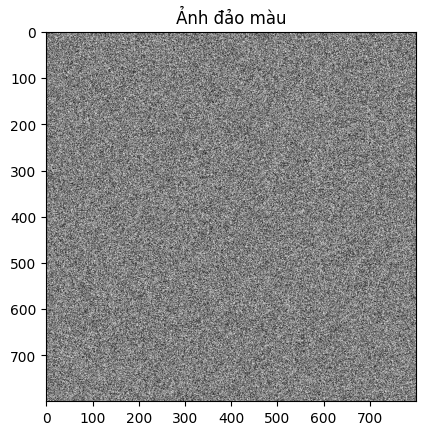

In [78]:
# Hiển thị ảnh màu bằng OpenCV
cv.imshow('Image', img)
cv.waitKey(0)  # Đợi nhấn phím để đóng cửa sổ

# Phép đảo màu: 255 - x
inverted_img = 255 - img

# Hiển thị ảnh đảo màu bằng Matplotlib
plt.imshow(inverted_img, cmap='gray')  
plt.title('Ảnh đảo màu')
plt.show()

# Hiển thị ảnh đảo màu bằng OpenCV
cv.imshow('Inverted Image', inverted_img)
cv.waitKey(0)  # Đợi nhấn phím để đóng cửa sổ
cv.destroyAllWindows()

3. Giá trị xám sẽ trở nên sáng hơn nếu nó gần với giá trị điểm ảnh tối đa (255) và sẽ tối hơn nếu nó gần với giá trị điểm ảnh tối thiểu (0). Một phép điều chỉnh sáng (brightness/light adjustment) sẽ dựa trên một hàm số nào đó để tăng giá trị của điểm ảnh hiện tại. Ví dụ, ta xét hàm số này dưới dạng tuyến tính Y=X+alpha. Hãy tạo ra 4 phiên bản ảnh chỉnh sáng với giá trị alpha={-100, -50, 50, 100}. Hãy biểu diễn 5 bức ảnh nói trên trên cùng một cửa sổ để xem kết quả. Lưu ý rằng nếu giá trị điểm ảnh sau khi chỉnh sáng lớn hơn 255 hoặc nhỏ hơn 0 sẽ bị cắt (truncate), tức là chỉ lấy 255 hoặc 0.

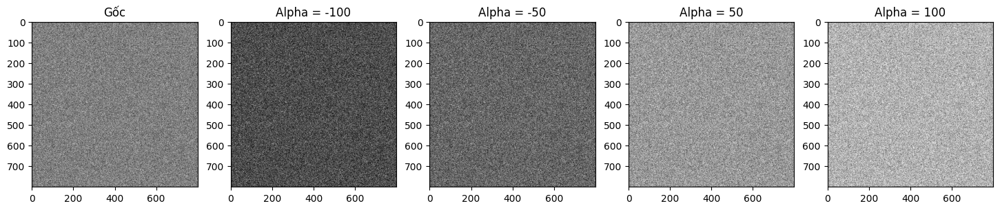

In [81]:
# Hàm điều chỉnh sáng (brightness adjustment)
def adjust_brightness(image, alpha):
    return np.clip(image.astype(np.int16) + alpha, 0, 255).astype('uint8')

# Các giá trị alpha
alpha_values = [-100, -50, 50, 100]

# Tạo danh sách các ảnh đã điều chỉnh sáng với các giá trị alpha
adjusted_images = [adjust_brightness(img, alpha) for alpha in alpha_values]

# Thêm ảnh gốc vào danh sách
adjusted_images.insert(0, img)

# Hiển thị các ảnh trên cùng một cửa sổ
fig, axes = plt.subplots(1, 5, figsize=(18, 6))

# Hiển thị ảnh gốc và các ảnh đã điều chỉnh sáng
for ax, image, alpha in zip(axes, adjusted_images, ['Gốc'] + [f'Alpha = {alpha}' for alpha in alpha_values]):
    ax.imshow(image, cmap='gray')  # Sử dụng cmap 'gray' để hiển thị ảnh xám
    ax.set_title(alpha)
    ax.axis('on')

plt.show()

# Hiển thị ảnh bằng OpenCV
cv.imshow('Ảnh gốc', img)
for alpha in alpha_values:
    cv.imshow(f'Ảnh điều chỉnh sáng alpha = {alpha}', adjust_brightness(img, alpha))

cv.waitKey(0)
cv.destroyAllWindows()


Phép chỉnh sáng cũng có thể được thực hiện thông qua phép nhân ma trận điểm ảnh với một số thực, ví dụ Y=X*beta. Nếu beta>1 thì ảnh sẽ sáng hơn, và ngược lại, beta<1 thì ảnh sẽ tối hơn. Hãy thử nghiệm phép chỉnh sáng với phép nhân với giá trị beta=0.7 và beta=1.3. Hãy biểu diễn 3 bức ảnh nói trên trên cùng một cửa sổ.

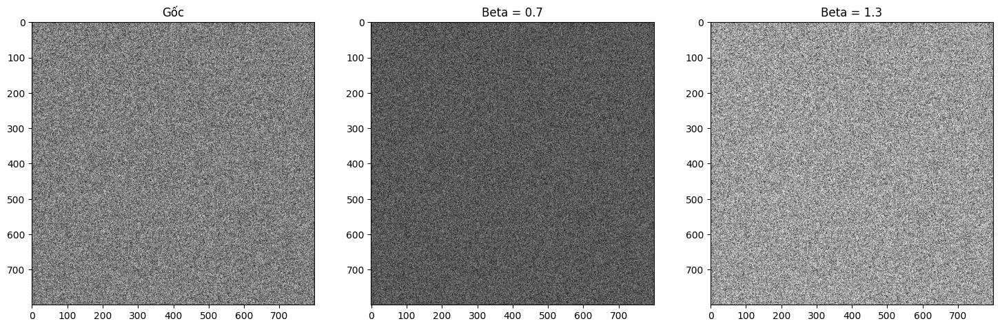

In [83]:
# Hàm điều chỉnh sáng bằng phép nhân với beta
def adjust_brightness_beta(image, beta):
    # Nhân ảnh với beta và sử dụng np.clip để cắt giá trị trong phạm vi [0, 255]
    return np.clip(image.astype(np.float32) * beta, 0, 255).astype('uint8')

# Các giá trị beta
beta_values = [0.7, 1.3]

# Tạo danh sách các ảnh đã điều chỉnh sáng với các giá trị beta
adjusted_images_beta = [adjust_brightness_beta(img, beta) for beta in beta_values]

# Thêm ảnh gốc vào danh sách
adjusted_images_beta.insert(0, img)

# Hiển thị các ảnh trên cùng một cửa sổ (chuyển đổi BGR sang RGB cho Matplotlib)
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Hiển thị ảnh gốc và các ảnh đã điều chỉnh sáng
for ax, image, beta in zip(axes, adjusted_images_beta, ['Gốc'] + [f'Beta = {beta}' for beta in beta_values]):
    ax.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))  # Chuyển đổi BGR sang RGB trước khi hiển thị
    ax.set_title(beta)
    ax.axis('on')

plt.show()

# Hiển thị ảnh bằng OpenCV
cv.imshow('Ảnh gốc', img)
for beta in beta_values:
    cv.imshow(f'Ảnh điều chỉnh sáng beta = {beta}', adjust_brightness_beta(img, beta))

cv.waitKey(0)
cv.destroyAllWindows()


5. Hãy chia ảnh thành 4 phần đều nhau có kích thước 400x400. Chọn lấy 3 phần theo thứ tự 1, 2, 3. Sử dụng mô hình màu RGB với ma trận kênh R, G, B lần lượt tương ứng là phần ảnh 1, 2, 3. Hãy hiển thị ảnh màu RGB vừa mới tạo ra.

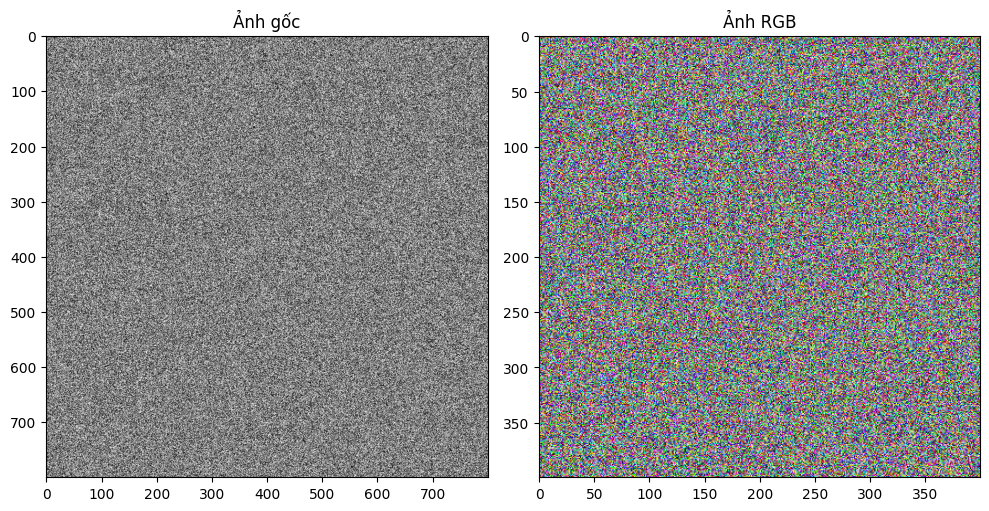

In [ ]:
# Tạo ma trận điểm ảnh ngẫu nhiên với kích thước 800x800 và 1 kênh màu xám
img = np.random.randint(0, 256, (800, 800), dtype='uint8')

# Chia ảnh thành 4 phần 400x400
part1 = img[:400, :400]  # Phần 1
part2 = img[:400, 400:]  # Phần 2
part3 = img[400:, :400]  # Phần 3

# Tạo ảnh màu RGB bằng cách xếp chồng 3 phần ảnh vào 3 kênh R, G, B
rgb_image = np.stack([part1, part2, part3], axis=2)

# Hiển thị ảnh gốc và ảnh RGB
plt.figure(figsize=(10, 5))

# Hiển thị ảnh gốc (ảnh xám)
plt.subplot(1, 2, 1)
plt.imshow(img, cmap='gray')  # Hiển thị ảnh xám
plt.title('Ảnh gốc')

# Hiển thị ảnh RGB mới tạo
plt.subplot(1, 2, 2)
plt.imshow(rgb_image)  # Hiển thị ảnh RGB
plt.title('Ảnh RGB')

plt.tight_layout()
plt.show()

# Hiển thị ảnh bằng OpenCV
cv.imshow('Ảnh gốc', img)
cv.imshow('Ảnh RGB', rgb_image)

cv.waitKey(0)
cv.destroyAllWindows()


6. Lặp lại các câu 2 đến 4 cho ảnh màu RGB vừa mới tạo.

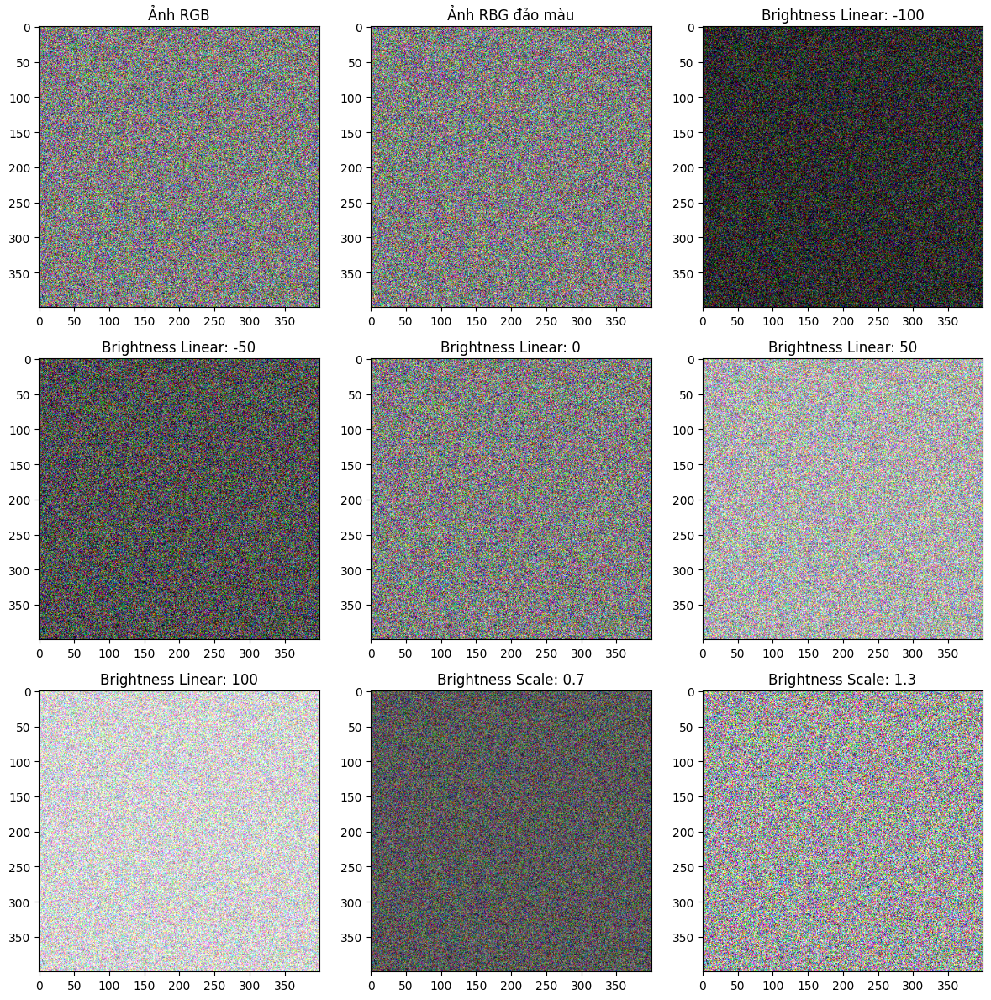

In [94]:
# Tạo ma trận điểm ảnh ngẫu nhiên với kích thước 800x800 và 1 kênh màu xám
image = np.random.randint(0, 256, (800, 800), dtype='uint8')

# Chia ảnh thành 4 phần 400x400
part1 = image[:400, :400]  # Phần 1
part2 = image[400:, :400]  # Phần 2
part3 = image[:400, 400:]  # Phần 3
part4 = image[400:, 400:]  # Phần 4

# Tạo ảnh màu RGB bằng cách xếp chồng 3 phần ảnh vào 3 kênh R, G, B
rgb_image = np.stack([part1, part2, part3], axis=2)

# Đảo màu
inverted_rgb_image = 255 - rgb_image

# Hàm điều chỉnh sáng tuyến tính
def Adjusted_linear(image, a):
    return np.clip(image.astype(np.int32) + a, 0, 255).astype(np.uint8)

# Hàm điều chỉnh sáng theo tỷ lệ
def Adjusted_scale(image, b):
    return np.clip(image.astype(np.float32) * b, 0, 255).astype(np.uint8)

# Vẽ ảnh
plt.figure(figsize=(12, 12))

# Hiển thị ảnh RGB
plt.subplot(3, 3, 1)
plt.imshow(rgb_image)
plt.title('Ảnh RGB')

# Hiển thị ảnh đảo màu
plt.subplot(3, 3, 2)
plt.imshow(inverted_rgb_image)
plt.title('Ảnh RBG đảo màu')

# Hiển thị các ảnh điều chỉnh sáng tuyến tính
test_value_linear = [-100, -50, 0, 50, 100]
for i, a in enumerate(test_value_linear):
    adjusted_linear_image = Adjusted_linear(rgb_image, a)
    plt.subplot(3, 3, i + 3)
    plt.imshow(adjusted_linear_image)
    plt.title(f"Brightness Linear: {a}")

# Hiển thị các ảnh điều chỉnh sáng theo tỷ lệ
test_value_scale = [0.7, 1.3]
for i, b in enumerate(test_value_scale):
    adjusted_scale_image = Adjusted_scale(rgb_image, b)
    plt.subplot(3, 3, i + 8)
    plt.imshow(adjusted_scale_image)
    plt.title(f"Brightness Scale: {b}")

plt.tight_layout()
plt.show()

# Hiển thị ảnh gốc và ảnh RGB bằng OpenCV
cv.imshow('Original Image', image)
cv.imshow('RGB Image', rgb_image)

cv.waitKey(0)
cv.destroyAllWindows()


7. Sử dụng mô hình màu HSV/HSL với ma trận kênh H, S, V/L tương ứng với các phần ảnh 1, 2, 3 ở bước 5. Hãy hiển thị ảnh màu HSV/HSL vừa mới tạo ra.

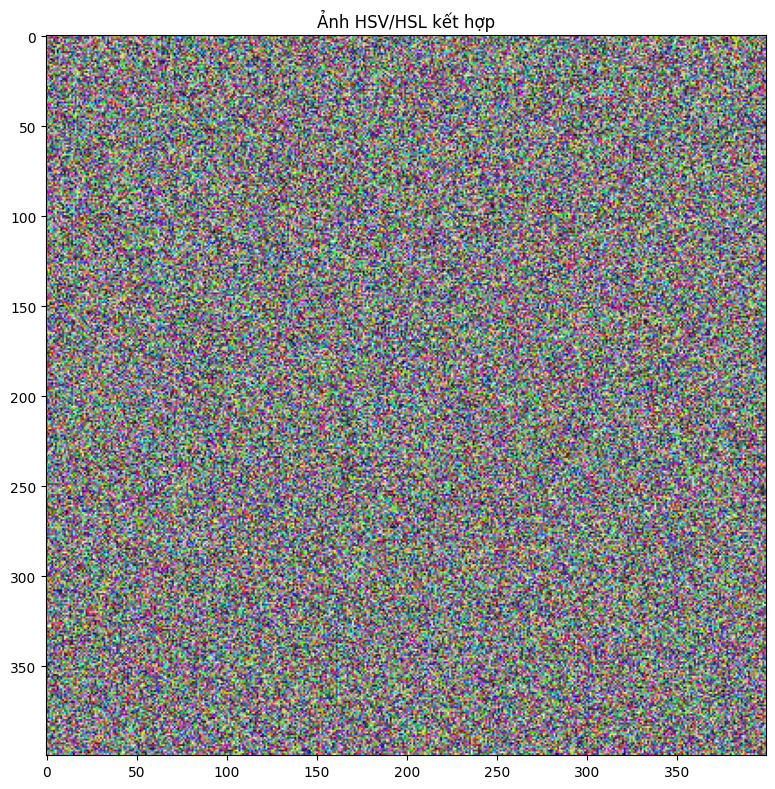

In [ ]:
# Tạo ma trận điểm ảnh ngẫu nhiên với kích thước 800x800 và 1 kênh màu xám
image = np.random.randint(0, 256, (800, 800), dtype=np.uint8)

# Chia ảnh thành 4 phần 400x400
part1 = image[:400, :400]  # Phần 1
part2 = image[400:, :400]  # Phần 2
part3 = image[:400, 400:]  # Phần 3
part4 = image[400:, 400:]  # Phần 4

# Tạo ảnh màu RGB bằng cách xếp chồng 3 phần ảnh vào 3 kênh R, G, B
rgb_image = np.stack([part1, part2, part3], axis=2)

# Chuyển đổi ảnh RGB sang HSV
hsv_image = cv.cvtColor(rgb_image, cv.COLOR_RGB2HSV)

# Tách các kênh H, S, V
hue_channel = hsv_image[:, :, 0]  # H (Hue Channel)
saturation_channel = hsv_image[:, :, 1]  # S (Saturation Channel)
value_channel = hsv_image[:, :, 2]  # V (Value Channel)

# Tạo ảnh HSV mới từ các phần ảnh đã chia
# part1 -> H, part2 -> S, part3 -> V
hsv_combined_image = np.zeros_like(hsv_image)

hsv_combined_image[:, :, 0] = hue_channel
hsv_combined_image[:, :, 1] = saturation_channel
hsv_combined_image[:, :, 2] = value_channel

# Chuyển ảnh HSV đã kết hợp sang RGB để hiển thị
new_rgb_image = cv.cvtColor(hsv_combined_image, cv.COLOR_HSV2RGB)

# Hiển thị ảnh HSV/HSL kết hợp
plt.figure(figsize=(8, 8))

plt.imshow(new_rgb_image)
plt.title('Ảnh HSV/HSL kết hợp')

plt.tight_layout()
plt.show()


 8. Lặp lại các câu 2 đến 4 cho ảnh màu HSV/HSL vừa mới tạo.

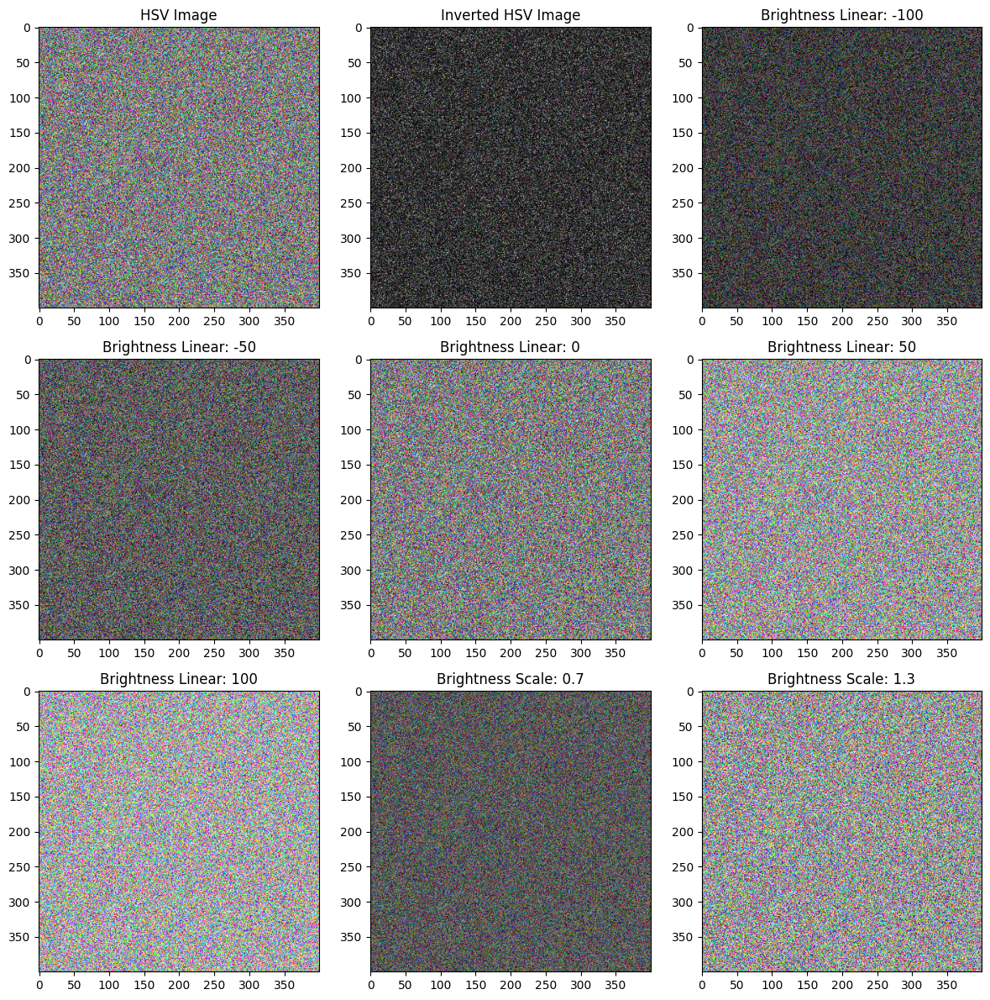

In [ ]:
# Tạo ma trận điểm ảnh ngẫu nhiên với kích thước 800x800 và 1 kênh màu xám
image = np.random.randint(0, 256, (800, 800), dtype='uint8')

# Chia ảnh thành 4 phần 400x400
part1 = image[:400, :400]  # Phần 1
part2 = image[400:, :400]  # Phần 2
part3 = image[:400, 400:]  # Phần 3
part4 = image[400:, 400:]  # Phần 4

# Tạo ảnh màu RGB bằng cách xếp chồng 3 phần ảnh vào 3 kênh R, G, B
rgb_image = np.stack([part1, part2, part3], axis=2)

# Chuyển đổi ảnh RGB sang HSV
hsv_image = cv.cvtColor(rgb_image, cv.COLOR_RGB2HSV)

# Inverted image (đảo màu)
inverted_hsv_image = 255 - hsv_image

# Hàm điều chỉnh sáng tuyến tính cho HSV
def Adjusted_linear_hsv(image, a):
    # Điều chỉnh sáng tuyến tính trong không gian HSV, chỉ điều chỉnh giá trị V (Value)
    adjusted_image = image.copy()
    adjusted_image[:, :, 2] = np.clip(adjusted_image[:, :, 2].astype(np.int32) + a, 0, 255)
    return adjusted_image.astype(np.uint8)

# Hàm điều chỉnh sáng theo tỷ lệ cho HSV
def Adjusted_scale_hsv(image, b):
    # Điều chỉnh sáng theo tỷ lệ trong không gian HSV, chỉ điều chỉnh giá trị V (Value)
    adjusted_image = image.copy()
    adjusted_image[:, :, 2] = np.clip(adjusted_image[:, :, 2].astype(np.float32) * b, 0, 255)
    return adjusted_image.astype(np.uint8)

# Vẽ ảnh
plt.figure(figsize=(12, 12))

# Hiển thị ảnh HSV
plt.subplot(3, 3, 1)
plt.imshow(cv.cvtColor(hsv_image, cv.COLOR_HSV2RGB))  # Hiển thị ảnh HSV dưới dạng RGB
plt.title('HSV Image')

# Hiển thị ảnh đảo màu (Inverted HSV)
plt.subplot(3, 3, 2)
plt.imshow(cv.cvtColor(inverted_hsv_image, cv.COLOR_HSV2RGB))  # Hiển thị ảnh đảo màu
plt.title('Inverted HSV Image')

# Hiển thị các ảnh điều chỉnh sáng tuyến tính
test_value_linear = [-100, -50, 0, 50, 100]
for i, a in enumerate(test_value_linear):
    adjusted_linear_image = Adjusted_linear_hsv(hsv_image, a)
    plt.subplot(3, 3, i + 3)
    plt.imshow(cv.cvtColor(adjusted_linear_image, cv.COLOR_HSV2RGB))  # Chuyển đổi HSV thành RGB để hiển thị
    plt.title(f"Brightness Linear: {a}")

# Hiển thị các ảnh điều chỉnh sáng theo tỷ lệ
test_value_scale = [0.7, 1.3]
for i, b in enumerate(test_value_scale):
    adjusted_scale_image = Adjusted_scale_hsv(hsv_image, b)
    plt.subplot(3, 3, i + 8)
    plt.imshow(cv.cvtColor(adjusted_scale_image, cv.COLOR_HSV2RGB))  # Chuyển đổi HSV thành RGB để hiển thị
    plt.title(f"Brightness Scale: {b}")

plt.tight_layout()
plt.show()

# Hiển thị ảnh gốc và ảnh HSV bằng OpenCV
cv.imshow('Original Image', image)
cv.imshow('HSV Image', cv.cvtColor(hsv_image, cv.COLOR_HSV2RGB))

cv.waitKey(0)
cv.destroyAllWindows()


9. Quay lại với bức ảnh có kích thước 800x800 ban đầu chưa khởi gán giá trị điểm ảnh (tức là mặc định toàn 0, gọi là ảnh A0 - nền đen toàn bộ). Chia bức ảnh này thành 4 phần bằng nhau, lấy 3 phần theo thứ tự là P1, P2, P3. Tăng kích thước của P1, P2, P3 lên 600x600. Chuyển ảnh P1, P2, P3 sang ảnh màu trong không gian RGBA (Kênh A - alpha, được bổ sung với giá trị 0 đến 255 cho ảnh 8 bit biểu diễn cho độ trong suốt của ảnh, càng gần 0 thì càng trong suốt). Sau đó, tô màu cho ảnh P1 là màu đỏ với alpha=100, tức là RGBA=(255, 0, 0, 100), cho ảnh P2 là màu blue (0, 0, 255, 100), và cho ảnh P3 là màu green (0, 255, 0, 100). Lần lượt gọi các ảnh mới tạo thành là R0, B0, G0. Chuyển ảnh nền A0 sang kênh RGBA với màu không đổi, tức alpha=255. Ghép 4 bức ảnh A0, R0, B0, G0 thành 1 ảnh trong đó lấy ảnh A0 làm nền.

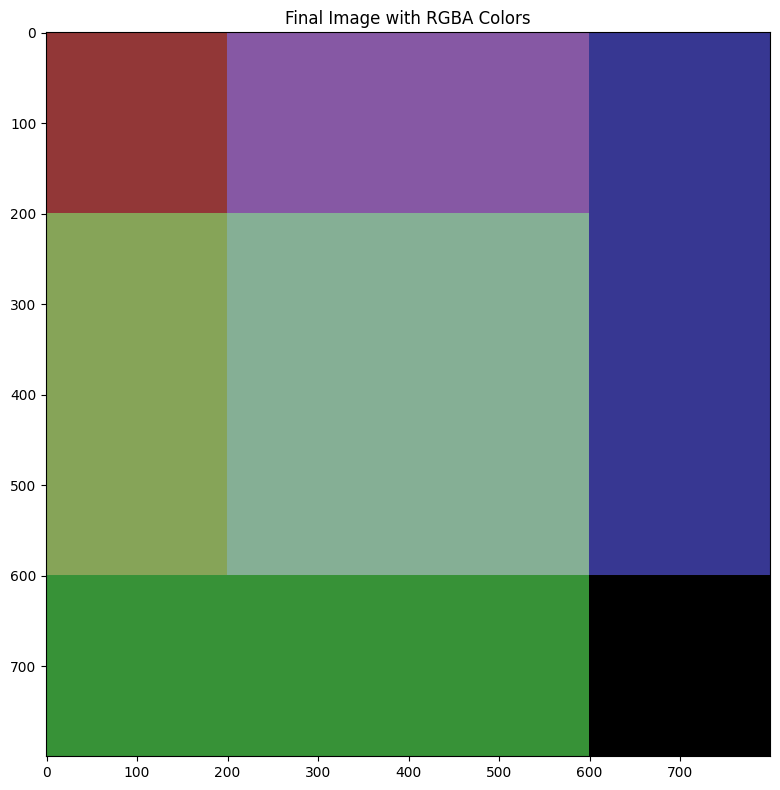

In [ ]:
# Khởi tạo ảnh A0 (800x800, nền đen, 4 kênh RGBA)
A0 = np.zeros((800, 800, 4), dtype=np.uint8)

# Chia A0 thành các phần P1, P2, P3
P1 = A0[0:400, 0:400]  # Phần 1
P2 = A0[0:400, 400:800]  # Phần 2
P3 = A0[400:800, 0:400]  # Phần 3

# Thay đổi kích thước các phần P1, P2, P3 lên 600x600
P1 = cv.resize(P1, (600, 600))
P2 = cv.resize(P2, (600, 600))
P3 = cv.resize(P3, (600, 600))

# Chuyển đổi các phần P1, P2, P3 sang không gian màu RGBA
P1 = cv.cvtColor(P1, cv.COLOR_RGB2RGBA)
P2 = cv.cvtColor(P2, cv.COLOR_RGB2RGBA)
P3 = cv.cvtColor(P3, cv.COLOR_RGB2RGBA)

# Tạo các ảnh R0, B0, G0 với màu sắc và alpha = 100
R0 = np.zeros_like(P1, dtype=np.uint8)
B0 = np.zeros_like(P2, dtype=np.uint8)
G0 = np.zeros_like(P3, dtype=np.uint8)

R0[:, :, :] = [255, 0, 0, 100]  # Màu đỏ, alpha = 100
B0[:, :, :] = [0, 0, 255, 100]  # Màu xanh lam, alpha = 100
G0[:, :, :] = [0, 255, 0, 100]  # Màu xanh lá, alpha = 100

# Chuyển đổi A0 sang RGBA (đảm bảo có 4 kênh)
A0 = cv.cvtColor(A0, cv.COLOR_RGB2RGBA)
A0[:, :, 3] = 255  # Đảm bảo alpha = 255 (không trong suốt)

# Ghép các phần R0, B0, G0 vào các góc của A0
A0[:600, :600] = cv.addWeighted(R0, 100/220.0, A0[:600, :600], 1 - 100/255.0, 0)
A0[:600, 200:] = cv.addWeighted(B0, 100/220.0, A0[:600, 200:], 1 - 100/255.0, 0)
A0[200:, :600] = cv.addWeighted(G0, 100/220.0, A0[200:, :600], 1 - 100/255.0, 0)

# Hiển thị ảnh kết quả
plt.figure(figsize=(8, 8))
plt.imshow(A0)
plt.title('Final Image with RGBA Colors')
plt.tight_layout()
plt.show()


10. Video kĩ thuật số về bản chất là một chuỗi các ảnh số liên tiếp được gọi là các khung hình (frame). Tốc độ trình chiếu của video (frames per a second) là tốc độ thay thế các khung hình trong một giây. Tốc độ này quyết định độ mượt của video. Tốc độ khung hình phổ biến hiện này là 30fps, với video slow motion (quay chậm), tốc độ có thể lên đến 60fps. Khả năng lưu ảnh của mắt người là 24fps, nên tốc độ từ 24fps trở lên, mắt người không có khả năng cảm nhận được sự thay đổi khung hình này. Dựa vào kết quả ở bước 9, Hãy lần lượt cho giá trị Red, Green, Blue của R0, G0, B0 thay đổi từ 0 đến 255 (tức sẽ tạo ra một video có 255 khung hình). Video mới được tạo ra dựa trên các khung hình này với tốc độ 25fps.

In [ ]:
# Khởi tạo ảnh nền A0 (800x800, nền đen, 4 kênh RGBA)
A0 = np.zeros((800, 800, 4), dtype=np.uint8)
A0[:, :, 3] = 255  # Đặt alpha = 255

# Tạo video
filename = 'video_lab1.mp4'
fps = 25
frame_size = (800, 800)
fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Codec video
video = cv2.VideoWriter(filename, fourcc, fps, frame_size)

# Ghép các phần màu và tạo video
for color_value in range(256):
    # Tạo R0, G0, B0 với giá trị color_value và alpha = 100
    R0 = np.zeros((600, 600, 4), dtype=np.uint8)
    G0 = np.zeros_like(R0)
    B0 = np.zeros_like(R0)
    R0[:, :, :] = [color_value, 0, 0, 100]  # Màu đỏ
    G0[:, :, :] = [0, color_value, 0, 100]  # Màu xanh lá
    B0[:, :, :] = [0, 0, color_value, 100]  # Màu xanh lam
    
    # Ghép vào A0
    A0[:600, :600] = R0
    A0[:600, 200:] = B0
    A0[200:, :600] = G0

    # Thêm khung hình vào video
    video.write(A0)

# Kết thúc và giải phóng tài nguyên
video.release()


Video đã được lưu thành công tại video_lab1.mp4
